In [2]:
import os 
from glob import glob
import pandas as pd
import numpy as np
from tqdm import tqdm
from matplotlib import dates as mdates
import datetime as dt
import mplfinance as mpf
import matplotlib.pyplot as plt
from mplfinance.original_flavor import candlestick_ohlc
import talib as ta

## Import Data from folder

In [7]:
# 
select_tf = ["day" , "5minute",'15minute',"60minute", "minute", "38minute"]
tables = [] 
final_data = {}

for filename in tqdm(glob('stock_data/*')):
    names = (filename.split(os.sep)[-1].split('_'))
    company_name = names[0]
    if names[1] in select_tf:
        data = pd.read_csv(filename, index_col=0)
        tf = names[1]
        variable_name = f"{company_name}_{tf}"
        locals()[variable_name] = data
        tables.append(variable_name)
        final_data[variable_name] = data

100%|████████████████████████████████████████████████████████████████████████████████| 909/909 [01:19<00:00, 11.42it/s]


In [8]:
ACC_38minute

,date,open,high,low,close,volume
0,2015-02-02 09:15:00+05:30,1554.90,1556.70,1536.05,1548.10,34335
1,2015-02-02 09:53:00+05:30,1548.10,1549.95,1540.35,1540.55,12323
2,2015-02-02 10:31:00+05:30,1541.00,1544.70,1538.10,1541.65,13197
3,2015-02-02 11:09:00+05:30,1541.65,1544.30,1539.00,1541.15,12779
4,2015-02-02 11:47:00+05:30,1541.15,1541.15,1523.85,1529.00,22168
...,...,...,...,...,...,...
17379,2022-10-21 13:16:00+05:30,2256.40,2257.70,2245.55,2247.05,21323
17380,2022-10-21 13:54:00+05:30,2248.10,2258.60,2241.05,2246.00,33306
17381,2022-10-21 14:32:00+05:30,2246.00,2260.00,2244.20,2258.65,39005
17382,2022-10-21 15:10:00+05:30,2260.00,2278.95,2254.30,2263.75,52389


## New Dataset Creation 

 2
### Pre-Process

In [4]:
def date_corrector(dicta):
    for df_name, df in tqdm(dicta.items(), desc="Processing data"):
        df['VolumePositive'] = df['open'] < df['close']
        df['date'] = pd.to_datetime(df['date'])
        df['datec'] = df['date'].dt.date
        df['date'] = df['date'].apply(mdates.date2num)
        df.set_index('datec', inplace=True)
    return dicta

In [9]:
date_corrector(final_data)

Processing data: 100%|███████████████████████████████████████████████████████████████| 606/606 [50:50<00:00,  5.03s/it]


{'ACC_15minute':                     date    close     high      low     open  volume  \
 datec                                                                  
 2015-02-02  16468.156250  1541.85  1556.70  1536.05  1554.90   15738   
 2015-02-02  16468.166667  1542.35  1549.90  1540.50  1541.05   13350   
 2015-02-02  16468.177083  1546.30  1549.20  1541.05  1542.35    8198   
 2015-02-02  16468.187500  1545.25  1549.95  1544.80  1547.30    6736   
 2015-02-02  16468.197917  1541.60  1548.00  1540.35  1545.20    2590   
 ...                  ...      ...      ...      ...      ...     ...   
 2022-10-11  19276.364583  2326.85  2339.50  2325.50  2336.55    5781   
 2022-10-11  19276.375000  2328.45  2332.00  2323.25  2326.85    9073   
 2022-10-11  19276.385417  2310.00  2329.50  2306.15  2328.45   18953   
 2022-10-11  19276.395833  2310.20  2318.45  2305.70  2311.20   23999   
 2022-10-11  19276.406250  2308.00  2316.70  2307.00  2311.05   37486   
 
             VolumePositive  
 da

In [10]:
 ACC_minute.tail(20)

,date,close,high,low,open,volume,VolumePositive
datec,,,,,,,
2022-10-24,19289.559028,2261.25,2262.40,2260.00,2260.55,746,True
2022-10-24,19289.559722,2259.95,2262.00,2258.65,2261.25,455,False
2022-10-24,19289.560417,2260.00,2260.95,2258.35,2260.40,237,False
2022-10-24,19289.561111,2260.85,2261.50,2258.90,2260.00,131,True
2022-10-24,19289.561806,2257.50,2260.70,2257.00,2258.00,718,False
2022-10-24,19289.562500,2257.05,2258.00,2254.60,2257.55,1699,False
2022-10-24,19289.563194,2257.35,2257.55,2255.00,2257.55,270,False
2022-10-24,19289.563889,2257.70,2257.70,2256.15,2257.30,426,True
2022-10-24,19289.564583,2257.05,2258.05,2256.00,2257.70,657,False


## Technical indicator test 

### Doji

In [11]:
df = ACC_day
doji = ta.CDLDOJI(df['open'], df['high'], df['low'], df['close'])

doji = doji[doji != 0]

df['Doji'] = ta.CDLDOJI(df['open'], df['high'], df['low'], df['close'])
df.loc[df['Doji'] !=0]
df['close'].loc[df['Doji'] !=0]

datec
2015-02-06    1507.20
2015-02-20    1620.40
2015-02-24    1618.00
2015-03-20    1569.75
2015-03-24    1583.05
               ...   
2022-09-28    2350.30
2022-09-29    2374.05
2022-10-04    2359.65
2022-10-06    2381.75
2022-10-12    2316.80
Name: close, Length: 298, dtype: float64

In [12]:
def doji(dicta):
    # Loop through each DataFrame in the final_data dictionary
    for df_name, df in tqdm(dicta.items(), desc="Calculating Doji patterns"):
        # Calculate the Doji pattern
        doji = ta.CDLDOJI(df['open'], df['high'], df['low'], df['close'])
    
        # Add the Doji pattern as a new column in the DataFrame
        df['Doji'] = doji

        # Add a new column to indicate whether each pattern is a Doji or not
        df['IsDoji'] = df['Doji'] != 0

    return dicta

In [13]:
doji(final_data)

Calculating Doji patterns: 100%|████████████████████████████████████████████████████| 606/606 [00:03<00:00, 179.79it/s]


{'ACC_15minute':                     date    close     high      low     open  volume  \
 datec                                                                  
 2015-02-02  16468.156250  1541.85  1556.70  1536.05  1554.90   15738   
 2015-02-02  16468.166667  1542.35  1549.90  1540.50  1541.05   13350   
 2015-02-02  16468.177083  1546.30  1549.20  1541.05  1542.35    8198   
 2015-02-02  16468.187500  1545.25  1549.95  1544.80  1547.30    6736   
 2015-02-02  16468.197917  1541.60  1548.00  1540.35  1545.20    2590   
 ...                  ...      ...      ...      ...      ...     ...   
 2022-10-11  19276.364583  2326.85  2339.50  2325.50  2336.55    5781   
 2022-10-11  19276.375000  2328.45  2332.00  2323.25  2326.85    9073   
 2022-10-11  19276.385417  2310.00  2329.50  2306.15  2328.45   18953   
 2022-10-11  19276.395833  2310.20  2318.45  2305.70  2311.20   23999   
 2022-10-11  19276.406250  2308.00  2316.70  2307.00  2311.05   37486   
 
             VolumePositive  Doji

### Moving Averages

In [14]:
def SMA(dicta):
    # Loop through each DataFrame in the dicta dictionary
    for df_name, df in tqdm(dicta.items(), desc="Calculating SMA and EMA"):
        df['SMA_20'] = df['close'].rolling(20).mean()
        df['SMA_50'] = df['close'].rolling(50).mean()
        df['SMA_200'] = df['close'].rolling(200).mean()

        df['EMA_50'] = ta.EMA(df['close'], timeperiod=50)
        df['EMA_200'] = ta.EMA(df['close'], timeperiod=200)
    
    return dicta

In [15]:
SMA(final_data)

Calculating SMA and EMA: 100%|███████████████████████████████████████████████████████| 606/606 [00:09<00:00, 63.06it/s]


{'ACC_15minute':                     date    close     high      low     open  volume  \
 datec                                                                  
 2015-02-02  16468.156250  1541.85  1556.70  1536.05  1554.90   15738   
 2015-02-02  16468.166667  1542.35  1549.90  1540.50  1541.05   13350   
 2015-02-02  16468.177083  1546.30  1549.20  1541.05  1542.35    8198   
 2015-02-02  16468.187500  1545.25  1549.95  1544.80  1547.30    6736   
 2015-02-02  16468.197917  1541.60  1548.00  1540.35  1545.20    2590   
 ...                  ...      ...      ...      ...      ...     ...   
 2022-10-11  19276.364583  2326.85  2339.50  2325.50  2336.55    5781   
 2022-10-11  19276.375000  2328.45  2332.00  2323.25  2326.85    9073   
 2022-10-11  19276.385417  2310.00  2329.50  2306.15  2328.45   18953   
 2022-10-11  19276.395833  2310.20  2318.45  2305.70  2311.20   23999   
 2022-10-11  19276.406250  2308.00  2316.70  2307.00  2311.05   37486   
 
             VolumePositive  Doji

In [16]:
ACC_day.columns

Index(['date', 'close', 'high', 'low', 'open', 'volume', 'VolumePositive',
       'Doji', 'IsDoji', 'SMA_20', 'SMA_50', 'SMA_200', 'EMA_50', 'EMA_200'],
      dtype='object')

### Bollinger Bands 

In [17]:
def Bollinger_Bands(dicta):
    # Loop through each DataFrame in the dicta dictionary
    for df_name, df in tqdm(dicta.items(), desc="Calculating Bollinger Bands"):
        n = 20
        MA = pd.Series(df['close'].rolling(n).mean())
        STD = pd.Series(df['close'].rolling(n).std())
        bb1 = MA + 2 * STD
        df['Upper Bollinger Band'] = pd.Series(bb1)
        bb2 = MA - 2 * STD
        df['Lower Bollinger Band'] = pd.Series(bb2)
    return dicta

In [18]:
Bollinger_Bands(final_data)

Calculating Bollinger Bands: 100%|███████████████████████████████████████████████████| 606/606 [00:07<00:00, 78.04it/s]


{'ACC_15minute':                     date    close     high      low     open  volume  \
 datec                                                                  
 2015-02-02  16468.156250  1541.85  1556.70  1536.05  1554.90   15738   
 2015-02-02  16468.166667  1542.35  1549.90  1540.50  1541.05   13350   
 2015-02-02  16468.177083  1546.30  1549.20  1541.05  1542.35    8198   
 2015-02-02  16468.187500  1545.25  1549.95  1544.80  1547.30    6736   
 2015-02-02  16468.197917  1541.60  1548.00  1540.35  1545.20    2590   
 ...                  ...      ...      ...      ...      ...     ...   
 2022-10-11  19276.364583  2326.85  2339.50  2325.50  2336.55    5781   
 2022-10-11  19276.375000  2328.45  2332.00  2323.25  2326.85    9073   
 2022-10-11  19276.385417  2310.00  2329.50  2306.15  2328.45   18953   
 2022-10-11  19276.395833  2310.20  2318.45  2305.70  2311.20   23999   
 2022-10-11  19276.406250  2308.00  2316.70  2307.00  2311.05   37486   
 
             VolumePositive  Doji

## MACD

In [19]:
def MACD(dicta):
    # Loop through each DataFrame in the dicta dictionary
    for df_name, df in tqdm(dicta.items(), desc="Calculating MACD"):
        df['macd'], df['macdsignal'], df['macdhist'] = ta.MACD(df['close'], fastperiod=12, slowperiod=26, signalperiod=9)
    return dicta

In [20]:
MACD(final_data)

Calculating MACD: 100%|█████████████████████████████████████████████████████████████| 606/606 [00:04<00:00, 142.64it/s]


{'ACC_15minute':                     date    close     high      low     open  volume  \
 datec                                                                  
 2015-02-02  16468.156250  1541.85  1556.70  1536.05  1554.90   15738   
 2015-02-02  16468.166667  1542.35  1549.90  1540.50  1541.05   13350   
 2015-02-02  16468.177083  1546.30  1549.20  1541.05  1542.35    8198   
 2015-02-02  16468.187500  1545.25  1549.95  1544.80  1547.30    6736   
 2015-02-02  16468.197917  1541.60  1548.00  1540.35  1545.20    2590   
 ...                  ...      ...      ...      ...      ...     ...   
 2022-10-11  19276.364583  2326.85  2339.50  2325.50  2336.55    5781   
 2022-10-11  19276.375000  2328.45  2332.00  2323.25  2326.85    9073   
 2022-10-11  19276.385417  2310.00  2329.50  2306.15  2328.45   18953   
 2022-10-11  19276.395833  2310.20  2318.45  2305.70  2311.20   23999   
 2022-10-11  19276.406250  2308.00  2316.70  2307.00  2311.05   37486   
 
             VolumePositive  Doji

 ## RSI

In [21]:
def RSI(dicta):
    # Loop through each DataFrame in the dicta dictionary
    for df_name, df in tqdm(dicta.items(), desc="Calculating RSI"):
        n = 14  # Number of periods
        change = df['close'].diff(1)
        df['Gain'] = change.mask(change < 0, 0)
        df['Loss'] = abs(change.mask(change > 0, 0))
        df['AVG_Gain'] = df.Gain.rolling(n).mean()
        df['AVG_Loss'] = df.Loss.rolling(n).mean()
        df['RS'] = df['AVG_Gain'] / df['AVG_Loss']
        df['RSI'] = 100 - (100 / (1 + df['RS']))
        df['RSI_ta'] = ta.RSI(df['close'], timeperiod=14)
    return dicta

In [22]:
RSI(final_data)

Calculating RSI: 100%|███████████████████████████████████████████████████████████████| 606/606 [00:13<00:00, 43.70it/s]


{'ACC_15minute':                     date    close     high      low     open  volume  \
 datec                                                                  
 2015-02-02  16468.156250  1541.85  1556.70  1536.05  1554.90   15738   
 2015-02-02  16468.166667  1542.35  1549.90  1540.50  1541.05   13350   
 2015-02-02  16468.177083  1546.30  1549.20  1541.05  1542.35    8198   
 2015-02-02  16468.187500  1545.25  1549.95  1544.80  1547.30    6736   
 2015-02-02  16468.197917  1541.60  1548.00  1540.35  1545.20    2590   
 ...                  ...      ...      ...      ...      ...     ...   
 2022-10-11  19276.364583  2326.85  2339.50  2325.50  2336.55    5781   
 2022-10-11  19276.375000  2328.45  2332.00  2323.25  2326.85    9073   
 2022-10-11  19276.385417  2310.00  2329.50  2306.15  2328.45   18953   
 2022-10-11  19276.395833  2310.20  2318.45  2305.70  2311.20   23999   
 2022-10-11  19276.406250  2308.00  2316.70  2307.00  2311.05   37486   
 
             VolumePositive  Doji

# Force Index

In [23]:
def Force_Index(dicta):
    n = 13
    # Loop through each DataFrame in the dicta dictionary
    for df_name, df in tqdm(dicta.items(), desc="Calculating Force Index"):
        df['FI_1'] = (df['close'] - df['close'].shift()) * df['volume']
        df['FI_13'] = df['FI_1'].ewm(ignore_na=False, span=n, min_periods=n, adjust=True).mean()
    return dicta

In [24]:
Force_Index(final_data)

Calculating Force Index: 100%|██████████████████████████████████████████████████████| 606/606 [00:05<00:00, 111.77it/s]


{'ACC_15minute':                     date    close     high      low     open  volume  \
 datec                                                                  
 2015-02-02  16468.156250  1541.85  1556.70  1536.05  1554.90   15738   
 2015-02-02  16468.166667  1542.35  1549.90  1540.50  1541.05   13350   
 2015-02-02  16468.177083  1546.30  1549.20  1541.05  1542.35    8198   
 2015-02-02  16468.187500  1545.25  1549.95  1544.80  1547.30    6736   
 2015-02-02  16468.197917  1541.60  1548.00  1540.35  1545.20    2590   
 ...                  ...      ...      ...      ...      ...     ...   
 2022-10-11  19276.364583  2326.85  2339.50  2325.50  2336.55    5781   
 2022-10-11  19276.375000  2328.45  2332.00  2323.25  2326.85    9073   
 2022-10-11  19276.385417  2310.00  2329.50  2306.15  2328.45   18953   
 2022-10-11  19276.395833  2310.20  2318.45  2305.70  2311.20   23999   
 2022-10-11  19276.406250  2308.00  2316.70  2307.00  2311.05   37486   
 
             VolumePositive  Doji

In [25]:
ACC_day

,date,close,high,low,open,volume,VolumePositive,Doji,IsDoji,SMA_20,...,macdhist,Gain,Loss,AVG_Gain,AVG_Loss,RS,RSI,RSI_ta,FI_1,FI_13
datec,,,,,,,,,,,,,,,,,,,,,
2015-01-01,16435.770833,1403.55,1411.00,1397.95,1400.15,101070,True,0,False,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-01-02,16436.770833,1425.90,1431.00,1405.55,1406.40,153349,True,0,False,NaN,...,NaN,22.35,0.00,NaN,NaN,NaN,NaN,NaN,3427350.15,NaN
2015-01-05,16439.770833,1433.65,1439.75,1423.75,1425.00,207979,True,0,False,NaN,...,NaN,7.75,0.00,NaN,NaN,NaN,NaN,NaN,1611837.25,NaN
2015-01-06,16440.770833,1383.55,1428.95,1370.55,1425.00,368755,False,0,False,NaN,...,NaN,0.00,50.10,NaN,NaN,NaN,NaN,NaN,-18474625.50,NaN
2015-01-07,16441.770833,1367.45,1384.95,1336.20,1382.00,301895,False,0,False,NaN,...,NaN,0.00,16.10,NaN,NaN,NaN,NaN,NaN,-4860509.50,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-10-17,19281.770833,2270.10,2285.05,2205.30,2232.00,1512370,True,0,False,2401.3500,...,-22.593903,26.45,0.00,12.885714,20.610714,0.625195,38.468920,41.112831,40002186.50,-5.048376e+06
2022-10-18,19282.770833,2219.25,2293.20,2216.00,2259.00,1189726,False,0,False,2380.2575,...,-22.847446,0.00,50.85,12.885714,23.900000,0.539151,35.029126,37.675232,-60497567.10,-1.296969e+07
2022-10-19,19283.770833,2246.45,2258.40,2212.55,2219.00,724058,True,0,False,2356.3000,...,-19.874054,27.20,0.00,14.828571,22.246429,0.666560,39.996147,40.539219,19694377.60,-8.303394e+06


## Plots 

In [26]:
# ## Test
# dfc = ACC_day
# fig = plt.figure(figsize=(14,10))
# ax = plt.subplot(2, 1, 1)
# candlestick_ohlc(ax,dfc.values, width=0.5, colorup='r', colordown='g', alpha=1.0)
# ax.xaxis_date()
# ax.xaxis.set_major_formatter(mdates.DateFormatter('%d-%m-%Y'))
# ax.grid(True, which='both')
# ax.minorticks_on()
# axv = ax.twinx()
# colors = dfc.VolumePositive.map({True: 'g', False: 'r'})
# axv.bar(dfc.date, dfc['volume'], color=colors, alpha=0.4)
# axv.axes.yaxis.set_ticklabels([])
# axv.set_ylim(0, 3*df.volume.max())
# ax.set_title('Stock '+ 'ACC_day' +' Closing Price')
# ax.set_ylabel('Price')

In [27]:
df = HDFC_day

In [28]:
def plot_candlestick_doji(df):
    df_name = [name for name in globals() if globals()[name] is df][0]
    
    fig = plt.figure(figsize=(20, 16))

    # Plot the first subplot (without Doji)
    ax1 = plt.subplot(2, 1, 1)
    candlestick_ohlc(ax1, df.values, width=0.5, colorup='g', colordown='r', alpha=1.0)
    ax1.xaxis_date()
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%d-%m-%Y'))
    ax1.grid(True, which='both')
    ax1.minorticks_on()
    axv1 = ax1.twinx()
    colors = df.VolumePositive.map({True: 'g', False: 'r'})
    axv1.bar(df.date, df['volume'], color=colors, alpha=0.4)
    axv1.axes.yaxis.set_ticklabels([])
    axv1.set_ylim(0, 3 * df.volume.max())
    ax1.set_title('Stock ' + df_name  + ' Closing Price')
    ax1.set_ylabel('Price')

    # Plot the second subplot (with Doji)
    ax2 = plt.subplot(2, 1, 2, sharex=ax1)
    candlestick_ohlc(ax2, df.values, width=0.5, colorup='g', colordown='r', alpha=1.0)
    ax2.xaxis_date()
    ax2.xaxis.set_major_formatter(mdates.DateFormatter('%d-%m-%Y'))
    ax2.grid(True, which='both')
    ax2.minorticks_on()
    doji_df = df[df['Doji'] != 0]
    ax2.plot_date(doji_df.index, doji_df['close'],
                  'or', fillstyle='none', ms=10.0)
    axv2 = ax2.twinx()
    colors = doji_df.VolumePositive.map({True: 'g', False: 'r'})
    axv2.bar(doji_df.date, doji_df['volume'], color=colors, alpha=0.4)
    axv2.axes.yaxis.set_ticklabels([])
    axv2.set_ylim(0, 3 * df.volume.max())
    ax2.set_title('Stock ' + df_name + ' Closing Price (with Doji)')
    ax2.set_ylabel('Price')

    plt.tight_layout()
    plt.show()

In [29]:
def plot_candlestick_smas(df):
    df_name = [name for name in globals() if globals()[name] is df][0]

    # Plot candlestick chart with SMAs
    fig = plt.figure(figsize=(14, 10))

    # First subplot (candlestick chart)
    ax1 = plt.subplot(2, 1, 1)
    ohlc = df[['date', 'open', 'high', 'low', 'close']].reset_index(drop=True)
    candlestick_ohlc(ax1, ohlc.values, width=0.5, colorup='g', colordown='r', alpha=1.0)
    ax1.xaxis_date()
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%d-%m-%Y'))
    ax1.grid(True, which='both')
    ax1.minorticks_on()
    axv1 = ax1.twinx()
    colors = df.VolumePositive.map({True: 'g', False: 'r'})
    axv1.bar(df.date, df['volume'], color=colors, alpha=0.4)
    axv1.axes.yaxis.set_ticklabels([])
    axv1.set_ylim(0, 3 * df.volume.max())
    ax1.set_title('Stock ' + df_name + ' Prices')
    ax1.set_ylabel('Price')

    # Second subplot (with SMAs)
    ax2 = plt.subplot(2, 1, 2, sharex=ax1)
    candlestick_ohlc(ax2, ohlc.values, width=0.5, colorup='g', colordown='r', alpha=1.0)
    ax2.plot(df.index, df['SMA_20'], label='SMA 20', color='blue')
    ax2.plot(df.index, df['SMA_50'], label='SMA 50', color='orange')
    ax2.plot(df.index, df['SMA_200'], label='SMA 200', color='purple')
    ax2.plot(df.index, df['EMA_50'], label='SMA 20', color='green')
    ax2.plot(df.index, df['EMA_200'], label='SMA 20', color='red')
    ax2.xaxis_date()
    ax2.xaxis.set_major_formatter(mdates.DateFormatter('%d-%m-%Y'))
    ax2.grid(True, which='both')
    ax2.minorticks_on()
    ax2.set_title('Stock ' + df_name + ' with SMAs')
    ax2.set_ylabel('Price')

    # Add legend
    ax2.legend(loc='upper left')

    plt.tight_layout()
    plt.show()



In [30]:
def plot_bollinger_bands(df):
    df_name = [name for name in globals() if globals()[name] is df][0]

    # Plot candlestick chart with SMAs
    fig = plt.figure(figsize=(14, 10))

    # First subplot (candlestick chart)
    ax1 = plt.subplot(2, 1, 1)
    ohlc = df[['date', 'open', 'high', 'low', 'close']].reset_index(drop=True)
    candlestick_ohlc(ax1, ohlc.values, width=0.5, colorup='g', colordown='r', alpha=1.0)
    ax1.xaxis_date()
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%d-%m-%Y'))
    ax1.grid(True, which='both')
    ax1.minorticks_on()
    axv1 = ax1.twinx()
    colors = df.VolumePositive.map({True: 'g', False: 'r'})
    axv1.bar(df.date, df['volume'], color=colors, alpha=0.4)
    axv1.axes.yaxis.set_ticklabels([])
    axv1.set_ylim(0, 3 * df.volume.max())
    ax1.set_title('Stock ' + df_name + ' Prices')
    ax1.set_ylabel('Price')

    # Second subplot (with SMAs)
    ax2 = plt.subplot(2, 1, 2, sharex=ax1)
    candlestick_ohlc(ax2, ohlc.values, width=0.5, colorup='g', colordown='r', alpha=1.0)
    ax2.plot(df.index, df['Upper Bollinger Band'], label='Upper Bollinger Band', color='green')  ##short when above
    ax2.plot(df.index, df['Lower Bollinger Band'], label='Lower Bollinger Band', color='red') ##long when below
    ax2.xaxis_date()
    ax2.xaxis.set_major_formatter(mdates.DateFormatter('%d-%m-%Y'))
    ax2.grid(True, which='both')
    ax2.minorticks_on()
    ax2.set_title('Stock ' + df_name + ' with SMAs')
    ax2.set_ylabel('Price')

    # Add legend
    ax2.legend(loc='upper left')

    plt.tight_layout()
    plt.show()

In [31]:
def plot_MACD(df):
    df_name = [name for name in globals() if globals()[name] is df][0]

    # Plot candlestick chart with SMAs
    fig = plt.figure(figsize=(14, 10))

    # First subplot (candlestick chart)
    ax1 = plt.subplot(2, 1, 1)
    ohlc = df[['date', 'open', 'high', 'low', 'close']].reset_index(drop=True)
    candlestick_ohlc(ax1, ohlc.values, width=0.5, colorup='g', colordown='r', alpha=1.0)
    ax1.xaxis_date()
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%d-%m-%Y'))
    ax1.grid(True, which='both')
    ax1.minorticks_on()
    axv1 = ax1.twinx()
    colors = df.VolumePositive.map({True: 'g', False: 'r'})
    axv1.bar(df.date, df['volume'], color=colors, alpha=0.4)
    axv1.axes.yaxis.set_ticklabels([])
    axv1.set_ylim(0, 3 * df.volume.max())
    ax1.set_title('Stock ' + df_name + ' Prices')
    ax1.set_ylabel('Price')

    # Second subplot (with SMAs)
    ax2 = plt.subplot(2, 1, 2, sharex=ax1)
    labels = ['macd','macdsignal']
    df['macd_positive'] = df['macdhist'] > 0
    ax2.plot(df[['macd','macdsignal']], label=labels)
    ax2.bar(df.index, df['macdhist'], color=df.macd_positive.map({True: 'g', False: 'r'}), label='macdhist')
    ax2.xaxis_date()
    ax2.xaxis.set_major_formatter(mdates.DateFormatter('%d-%m-%Y'))
    ax2.grid(True, which='both')
    ax2.minorticks_on()
    ax2.set_title('Stock ' + df_name + ' with SMAs')
    ax2.set_ylabel('Price')

    # Add legend
    ax2.legend(loc='upper left')

    plt.tight_layout()
    plt.show()

In [32]:
def plot_RSI(df):
    df_name = [name for name in globals() if globals()[name] is df][0]

    # Plot candlestick chart with SMAs
    fig = plt.figure(figsize=(14, 10))

    # First subplot (candlestick chart)
    ax1 = plt.subplot(2, 1, 1)
    ohlc = df[['date', 'open', 'high', 'low', 'close']].reset_index(drop=True)
    candlestick_ohlc(ax1, ohlc.values, width=0.5, colorup='g', colordown='r', alpha=1.0)
    ax1.xaxis_date()
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%d-%m-%Y'))
    ax1.grid(True, which='both')
    ax1.minorticks_on()
    axv1 = ax1.twinx()
    colors = df.VolumePositive.map({True: 'g', False: 'r'})
    axv1.bar(df.date, df['volume'], color=colors, alpha=0.4)
    axv1.axes.yaxis.set_ticklabels([])
    axv1.set_ylim(0, 3 * df.volume.max())
    ax1.set_title('Stock ' + df_name + ' Prices')
    ax1.set_ylabel('Price')

    # Second subplot (with SMAs)
    ax2 = plt.subplot(2, 1, 2, sharex=ax1)
    ax2.plot(df['RSI'], label='Relative Strength Index')
#     ax2.text(s='Overbought', x=df.RSI.index[30], y=70, fontsize=14)
#     ax2.text(s='Oversold', x=df.RSI.index[30], y=30, fontsize=14)
    ax2.fill_between(df.index, y1=30, y2=70, color='#adccff', alpha=0.3)
    ax2.axhline(y=70, color='red')
    ax2.axhline(y=30, color='red')
    ax2.grid()
    ax2.set_ylabel('RSI')
    ax2.set_xlabel('Date')
    ax2.legend(loc='best')
#     # Add legend
#     ax2.legend(loc='upper left')

    plt.tight_layout()
    plt.show()

In [33]:
def plot_Force_Index(df):
    df_name = [name for name in globals() if globals()[name] is df][0]

    # Plot candlestick chart with SMAs
    fig = plt.figure(figsize=(14, 10))

    # First subplot (candlestick chart)
    ax1 = plt.subplot(2, 1, 1)
    ohlc = df[['date', 'open', 'high', 'low', 'close']].reset_index(drop=True)
    candlestick_ohlc(ax1, ohlc.values, width=0.5, colorup='r', colordown='g', alpha=1.0)
    ax1.xaxis_date()
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%d-%m-%Y'))
    ax1.grid(True, which='both')
    ax1.minorticks_on()
    axv1 = ax1.twinx()
    colors = df.VolumePositive.map({True: 'g', False: 'r'})
    axv1.bar(df.date, df['volume'], color=colors, alpha=0.4)
    axv1.axes.yaxis.set_ticklabels([])
    axv1.set_ylim(0, 3 * df.volume.max())
    ax1.set_title('Stock ' + df_name + ' Prices')
    ax1.set_ylabel('Price')

    # Second subplot (with SMAs)
    ax2 = plt.subplot(2, 1, 2, sharex=ax1)
    ax2.plot(df['FI_13'], label='13-Period Force Index', color='black')
    ax2.axhline(y=0, color='blue', linestyle='--')
    ax2.fill_between(df.index, df['FI_13'], where=df['FI_13']>0, color='green')
    ax2.fill_between(df.index, df['FI_13'], where=df['FI_13']<0, color='red')
    ax2.grid()
    ax2.set_ylabel('13-Period Force Index')
    ax2.set_xlabel('Date')
    ax2.legend(loc='best')

In [34]:
df = ACC_day
df

,date,close,high,low,open,volume,VolumePositive,Doji,IsDoji,SMA_20,...,macdhist,Gain,Loss,AVG_Gain,AVG_Loss,RS,RSI,RSI_ta,FI_1,FI_13
datec,,,,,,,,,,,,,,,,,,,,,
2015-01-01,16435.770833,1403.55,1411.00,1397.95,1400.15,101070,True,0,False,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-01-02,16436.770833,1425.90,1431.00,1405.55,1406.40,153349,True,0,False,NaN,...,NaN,22.35,0.00,NaN,NaN,NaN,NaN,NaN,3427350.15,NaN
2015-01-05,16439.770833,1433.65,1439.75,1423.75,1425.00,207979,True,0,False,NaN,...,NaN,7.75,0.00,NaN,NaN,NaN,NaN,NaN,1611837.25,NaN
2015-01-06,16440.770833,1383.55,1428.95,1370.55,1425.00,368755,False,0,False,NaN,...,NaN,0.00,50.10,NaN,NaN,NaN,NaN,NaN,-18474625.50,NaN
2015-01-07,16441.770833,1367.45,1384.95,1336.20,1382.00,301895,False,0,False,NaN,...,NaN,0.00,16.10,NaN,NaN,NaN,NaN,NaN,-4860509.50,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-10-17,19281.770833,2270.10,2285.05,2205.30,2232.00,1512370,True,0,False,2401.3500,...,-22.593903,26.45,0.00,12.885714,20.610714,0.625195,38.468920,41.112831,40002186.50,-5.048376e+06
2022-10-18,19282.770833,2219.25,2293.20,2216.00,2259.00,1189726,False,0,False,2380.2575,...,-22.847446,0.00,50.85,12.885714,23.900000,0.539151,35.029126,37.675232,-60497567.10,-1.296969e+07
2022-10-19,19283.770833,2246.45,2258.40,2212.55,2219.00,724058,True,0,False,2356.3000,...,-19.874054,27.20,0.00,14.828571,22.246429,0.666560,39.996147,40.539219,19694377.60,-8.303394e+06


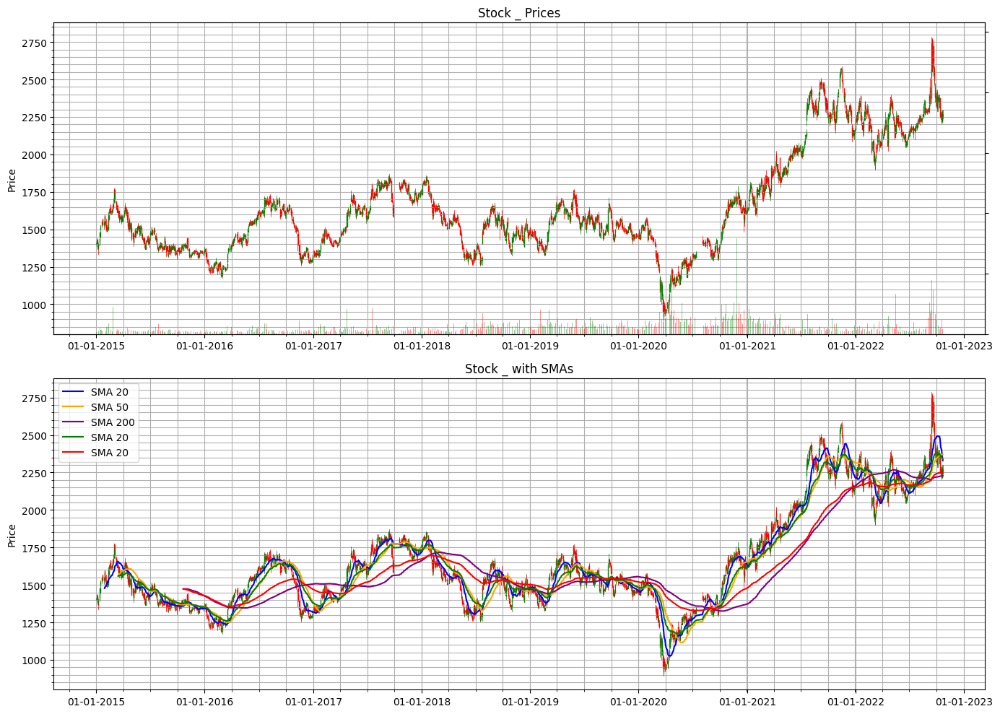

In [35]:
plot_candlestick_smas(df)

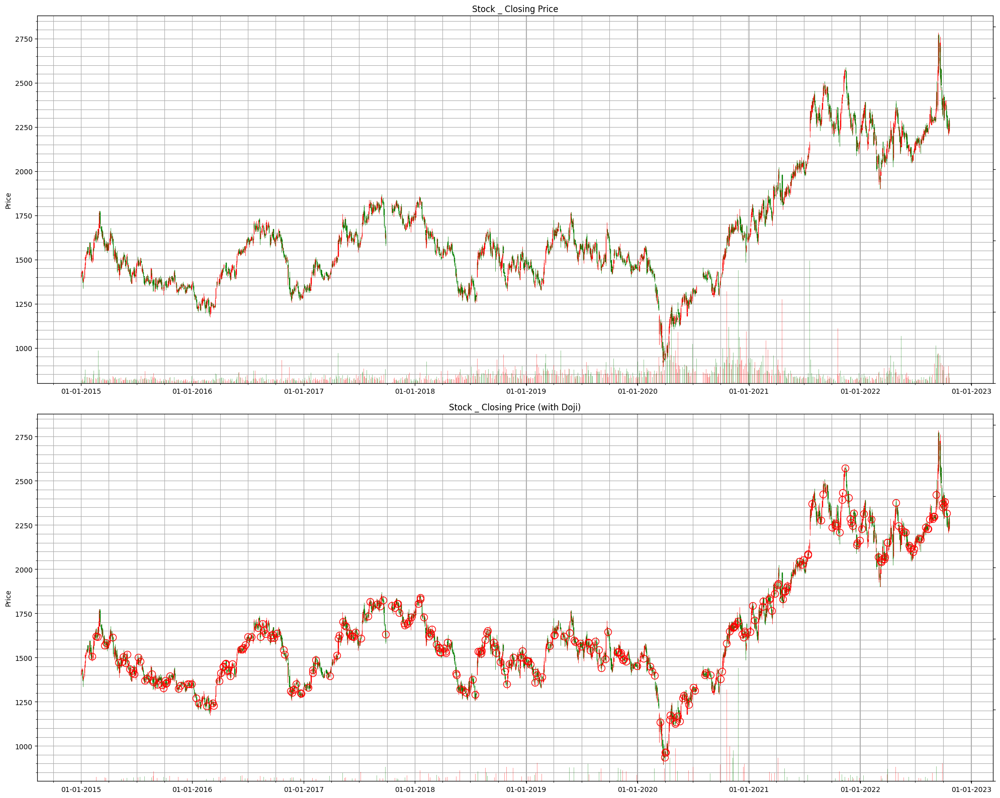

In [36]:
plot_candlestick_doji(df)

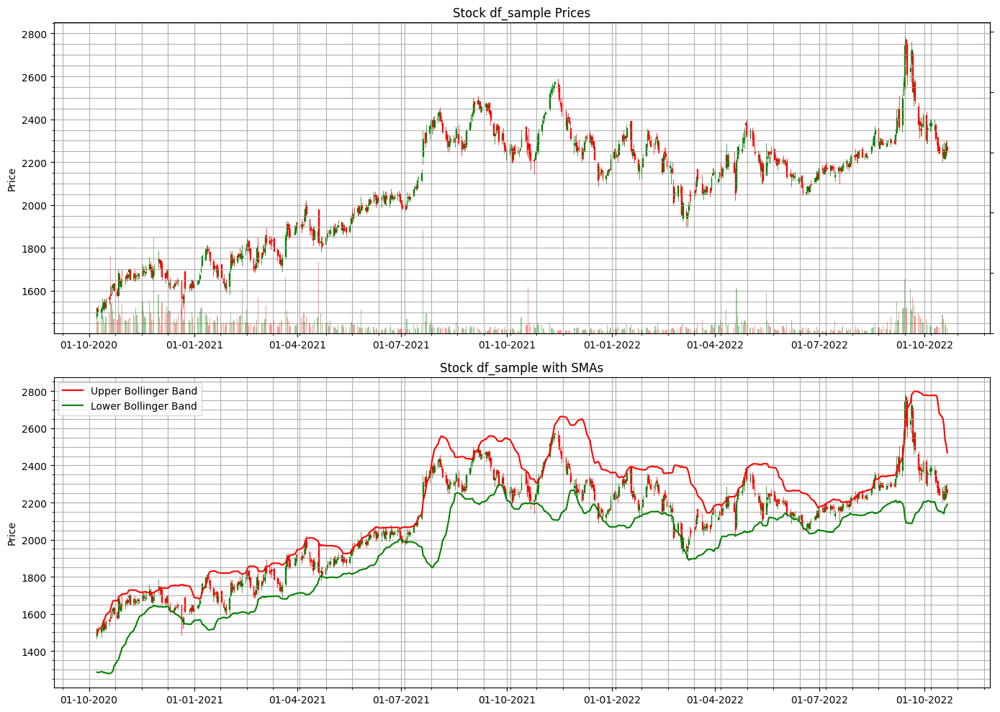

In [37]:
df_sample = df.iloc[1400:, :]
plot_bollinger_bands(df_sample)

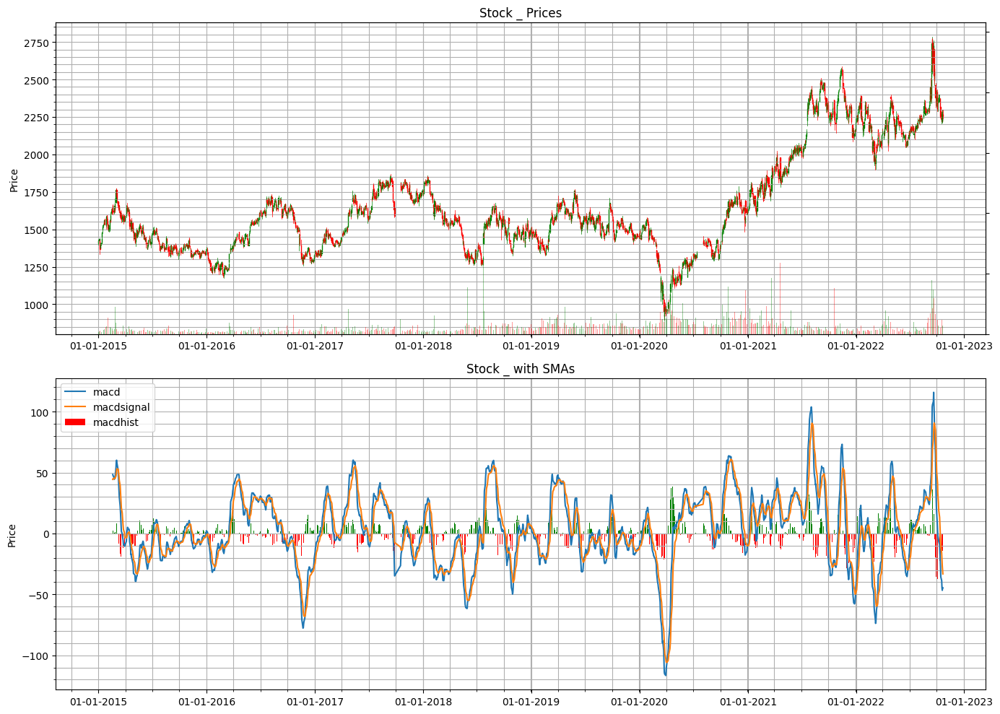

In [38]:
plot_MACD(df)

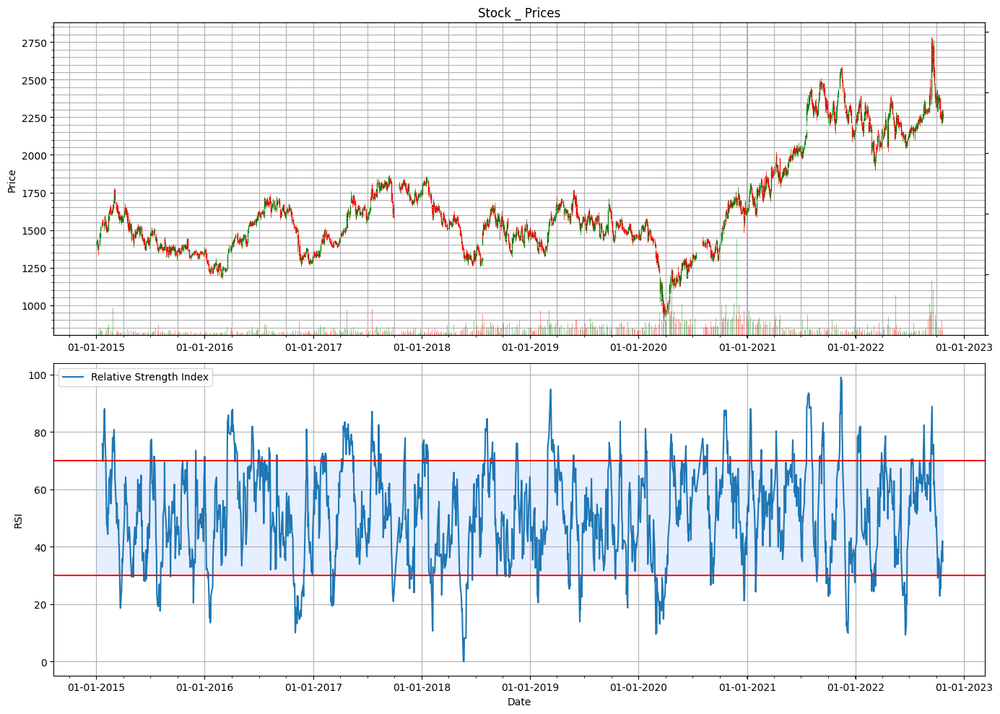

In [39]:
plot_RSI(df)

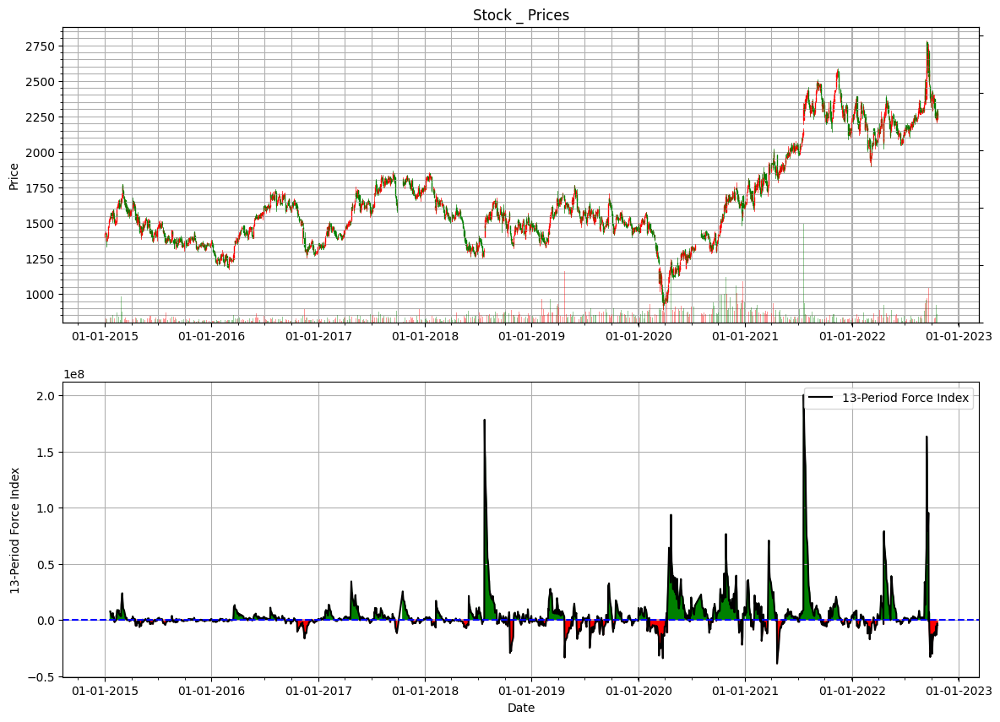

In [40]:
plot_Force_Index(df)

## Exporting Data With Technical Indicators 

In [41]:
for df_name, df in final_data.items():
    file_name = f'TI_Data/{df_name}'
    df.to_csv(file_name)